# **EDA and Hypothesis Testing of Climatic Variables (Part 1)**

In [1]:
# Libraries
import pandas as pd
import numpy as np
from scipy.stats import skew, kurtosis, spearmanr, pearsonr
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from IPython.display import Image, display

# Data
df = pd.read_csv('AVONETplusClim.csv' )

## **1. Body Size (Mass)**

First of all, distribution of mass is explored using histograms. For the raw data: 

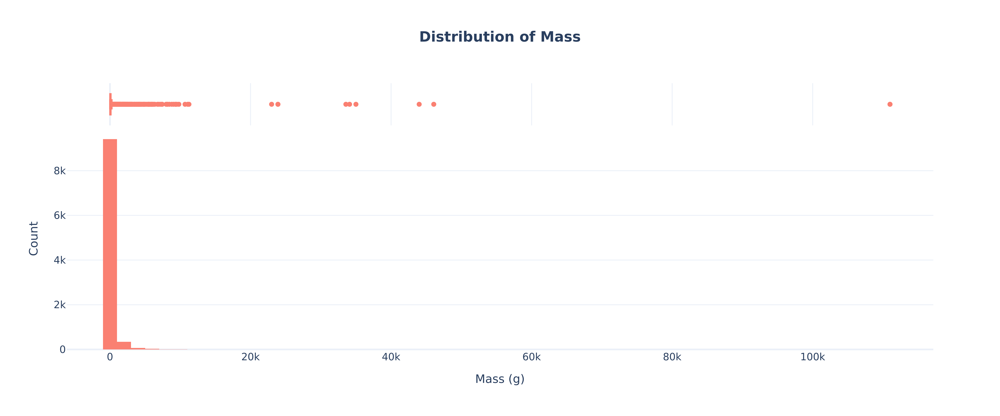

In [2]:
fig = px.histogram(
    df, 
    x='Mass', 
    title='<b>Distribution of Mass</b>', 
    nbins=100, 
    marginal='box',
    color_discrete_sequence=['salmon']
)

fig.update_layout(
    title_x=0.5, 
    xaxis_title="Mass (g)", 
    yaxis_title="Count", 
    template="plotly_white",
    width=1200,
    height=500
)

fig.write_image("Mass_Raw_Histogram.png", scale=5)
display(Image("Mass_Raw_Histogram.png"))

The data is extremely right-skewed. In addition, there are 11 outliers that disrupt the visualization (>10000 g). To approach a biologically meaningful distribution and improve the visualization, log-transformation is applied. Additionally, the outliers are excluded since they make up a negligible fraction of the dataset (11/9878):

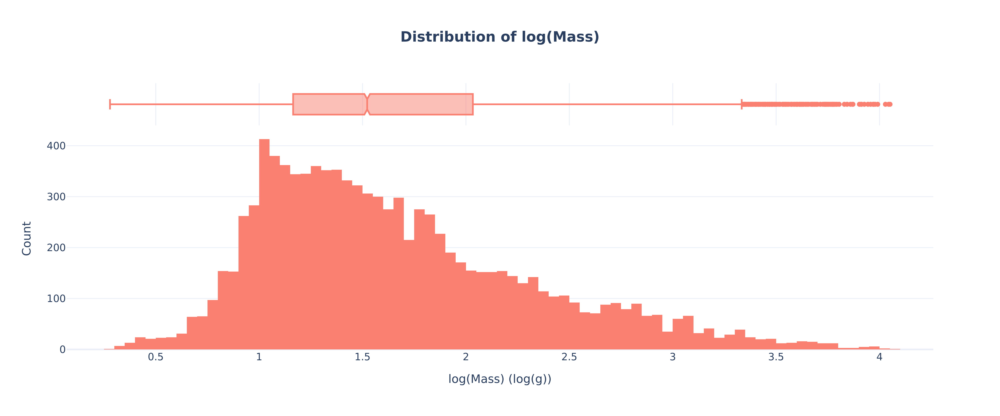

In [3]:
df_clean = df[(df['Mass'] < 11500) & (df['Mass'] > 0)].copy()
df_clean['Log_Mass'] = np.log10(df_clean['Mass'])

fig = px.histogram(
    df_clean, 
    x='Log_Mass', 
    title='<b>Distribution of log(Mass)</b>', 
    nbins=100, 
    marginal='box',
    color_discrete_sequence=['salmon']
)

fig.update_layout(
    title_x=0.5, 
    xaxis_title="log(Mass) (log(g))", 
    yaxis_title="Count", 
    template="plotly_white",
    width=1200,
    height=500
)

fig.write_image("Mass_Log_Histogram.png", scale=5)
display(Image("Mass_Log_Histogram.png"))

The data is less but still visibly right-skewed. To assess the normality of distribution, skewness and kurtosis are calculated since Shapiro-Wilk test is unreliable for large sample sizes (>5000):

In [4]:
skew_val = skew(df_clean['Log_Mass'])
kurt_val = kurtosis(df_clean['Log_Mass'])

print(f"Skewness: {skew_val:.4f}")
print(f"Kurtosis: {kurt_val:.4f}")

Skewness: 0.8518
Kurtosis: 0.3485


Both skewness and kurtosis fall between -1 and 1, thus the distribution is safe to assume to be normal.

### **1.1. Mass and Temperature**

Before testing with temperature, similar to mass, distribution of temperature is explored based on skewness and kurtosis. For minimum, maximum, and average temperatures:

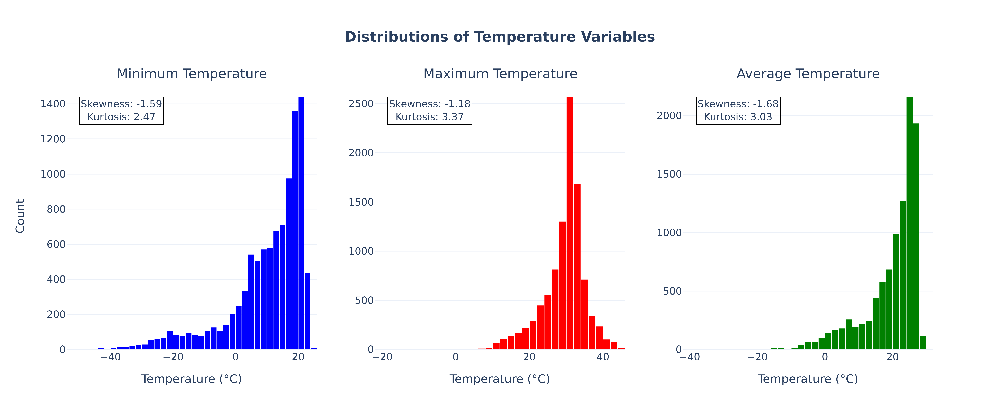

In [5]:
fig = make_subplots(
    rows=1, cols=3, 
    subplot_titles=("Minimum Temperature", "Maximum Temperature", "Average Temperature")
)

d6 = df_clean['Min.Temperature']
s6, k6 = skew(d6), kurtosis(d6)

fig.add_trace(go.Histogram(x=d6, nbinsx=50, name='Min.Temperature', marker_color='blue'), row=1, col=1)

fig.add_annotation(
    text=f"Skewness: {s6:.2f}<br>Kurtosis: {k6:.2f}",
    xref="x domain", yref="y domain",
    x=0.05, y=0.95, showarrow=False,
    bgcolor="rgba(255, 255, 255, 0.8)", bordercolor="black", borderwidth=1,
    row=1, col=1
)

d5 = df_clean['Max.Temperature']
s5, k5 = skew(d5), kurtosis(d5)

fig.add_trace(go.Histogram(x=d5, nbinsx=50, name='Max.Temperature', marker_color='red'), row=1, col=2)

fig.add_annotation(
    text=f"Skewness: {s5:.2f}<br>Kurtosis: {k5:.2f}",
    xref="x domain", yref="y domain",
    x=0.05, y=0.95, showarrow=False,
    bgcolor="rgba(255, 255, 255, 0.8)", bordercolor="black", borderwidth=1,
    row=1, col=2
)

d1 = df_clean['Mean.Temperature']
s1, k1 = skew(d1), kurtosis(d1)

fig.add_trace(go.Histogram(x=d1, nbinsx=50, name='Mean.Temperature', marker_color='green'), row=1, col=3)

fig.add_annotation(
    text=f"Skewness: {s1:.2f}<br>Kurtosis: {k1:.2f}",
    xref="x domain", yref="y domain",
    x=0.05, y=0.95, showarrow=False,
    bgcolor="rgba(255, 255, 255, 0.8)", bordercolor="black", borderwidth=1,
    row=1, col=3
)

fig.update_layout(
    title_x=0.5,
    title_text="<b>Distributions of Temperature Variables</b>",
    showlegend=False,
    bargap=0.1,
    template="plotly_white",
    height=500,
    width=1200
)

fig.update_xaxes(title_text="Temperature (°C)", row=1, col=1)
fig.update_xaxes(title_text="Temperature (°C)", row=1, col=2)
fig.update_xaxes(title_text="Temperature (°C)", row=1, col=3)
fig.update_yaxes(title_text="Count", row=1, col=1)

fig.write_image("Temperature_Raw_Histogram.png", scale=5)
display(Image("Temperature_Raw_Histogram.png"))

The data is highly left-skewed. Attempts to normalize the data, such as shifting and squaring the values, could work but the biological meaning would be lost. Therefore, to be able to directly interpret the values, raw scale is kept for temperature variables. Consequently, rejecting a normal distribution, a non-parametric measure is used to assess correlation, which is Spearman's rank correlation coefficient.

For minimum temperature:

* H0: There is no correlation between mass and minimum temperature.
* H1: There is a correlation between mass and minimum temperature. 

In [6]:
correlation_rho, p_value_spearman = spearmanr(df['Min.Temperature'], df['Mass'])

print(f"Spearman rho: {correlation_rho:.4f}")
print(f"p-value: {p_value_spearman:.4e}")

Spearman rho: -0.0346
p-value: 5.9205e-04


For maximum temperature:

* H0: There is no correlation between mass and maximum temperature.
* H1: There is a correlation between mass and maximum temperature. 

In [7]:
correlation_rho, p_value_spearman = spearmanr(df['Max.Temperature'], df['Mass'])

print(f"Spearman rho: {correlation_rho:.4f}")
print(f"p-value: {p_value_spearman:.4e}")

Spearman rho: 0.0285
p-value: 4.6358e-03


For average temperature:

* H0: There is no correlation between mass and average temperature.
* H1: There is a correlation between mass and average temperature. 

In [8]:
correlation_rho, p_value_spearman = spearmanr(df['Mean.Temperature'], df['Mass'])

print(f"Spearman rho: {correlation_rho:.4f}")
print(f"p-value: {p_value_spearman:.4e}")

Spearman rho: -0.0120
p-value: 2.3125e-01


For minimum and maximum temperature, p < 0.05, thus the null hypotheses are rejected. There is a statistically significant relationship between mass and minimum temperature, as well as maximum temperature. However, for average temperature, p > 0.05, thus the null hypothesis is failed to reject. To illustrate the relationships, scatter plots are created:

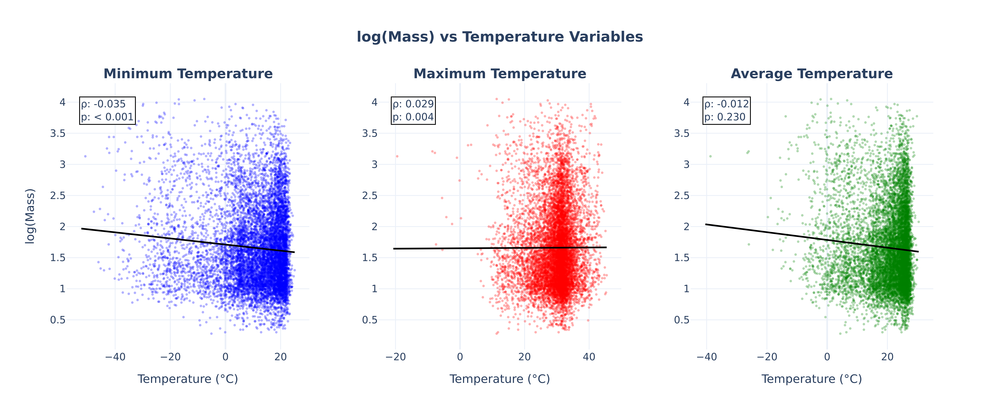

In [9]:
color_map = {
    'Min.Temperature': 'blue',
    'Max.Temperature': 'red',
    'Mean.Temperature': 'green'
}

fig = make_subplots(
    rows=1, cols=3,
    subplot_titles=("<b>Minimum Temperature</b>", "<b>Maximum Temperature</b>", "<b>Average Temperature</b>"),
    horizontal_spacing=0.08
)

for i, var in enumerate(['Min.Temperature', 'Max.Temperature', 'Mean.Temperature']):
    x_data = df_clean[var]
    y_data = df_clean['Log_Mass']

    rho, p_val = spearmanr(x_data, y_data)
    p_text = "< 0.001" if p_val < 0.001 else f"{p_val:.3f}"

    fig.add_trace(
        go.Scatter(
            x=x_data, y=y_data, 
            mode='markers', 
            marker=dict(size=3, color=color_map[var], opacity=0.3),
            showlegend=False
        ),
        row=1, col=i+1
    )

    m, b = np.polyfit(x_data, y_data, 1)
    x_line = np.linspace(x_data.min(), x_data.max(), 100)
    y_line = m * x_line + b
    
    fig.add_trace(
        go.Scatter(
            x=x_line, y=y_line, 
            mode='lines', 
            line=dict(color='black', width=2),
            showlegend=False
        ),
        row=1, col=i+1
    )

    xref_val = "x domain" if i == 0 else f"x{i+1} domain"
    yref_val = "y domain" if i == 0 else f"y{i+1} domain"

    fig.add_annotation(
        text=f"ρ: {rho:.3f}<br>p: {p_text}",
        xref=xref_val, yref=yref_val,
        x=0.05, y=0.95,
        showarrow=False,
        bgcolor="white",
        bordercolor="black",
        font=dict(size=12),
        align="left"
    )

    fig.update_xaxes(title_text="Temperature (°C)", row=1, col=i+1)

fig.update_yaxes(title_text="log(Mass)", row=1, col=1)
fig.update_layout(
    title_text="<b>log(Mass) vs Temperature Variables</b>",
    title_x=0.5,
    height=500,
    width=1200,
    template="plotly_white"
)

fig.write_image("Mass_Temperature.png", scale=5)
display(Image("Mass_Temperature.png"))

### **1.2. Mass and Precipitation**

Before testing with precipitation, distribution of precipitation is explored based on skewness and kurtosis:

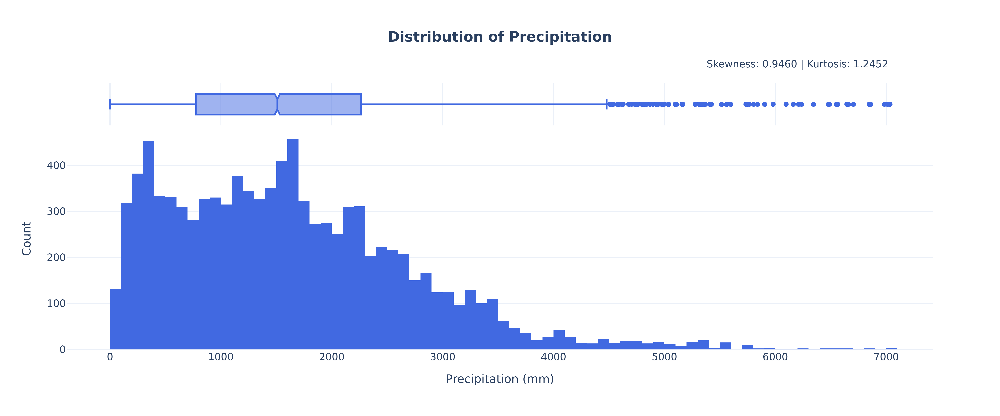

In [10]:
s = skew(df_clean['Mean.Precipitation'])
k = kurtosis(df_clean['Mean.Precipitation'])

fig = px.histogram(
    df_clean, 
    x='Mean.Precipitation', 
    nbins=100, 
    title='<b>Distribution of Precipitation</b>',
    marginal='box',
    color_discrete_sequence=['royalblue']
)

fig.add_annotation(
    text=f"Skewness: {s:.4f} | Kurtosis: {k:.4f}",
    xref="paper", yref="paper",
    x=0.95, y=1.1,
    showarrow=False,
    font=dict(size=12)
)

fig.update_layout(
    title_x=0.5,
    yaxis_title="Count",
    xaxis_title="Precipitation (mm)",
    template="plotly_white",
    width=1200,
    height=500
)

fig.write_image("Precipitation_Raw_Histogram.png", scale=5)
display(Image("Precipitation_Raw_Histogram.png"))

The data is left-skewed. This time, the data can be normalized since precipitation is measured as a quantity, similar to mass. To normalize, square-root transformation is used:

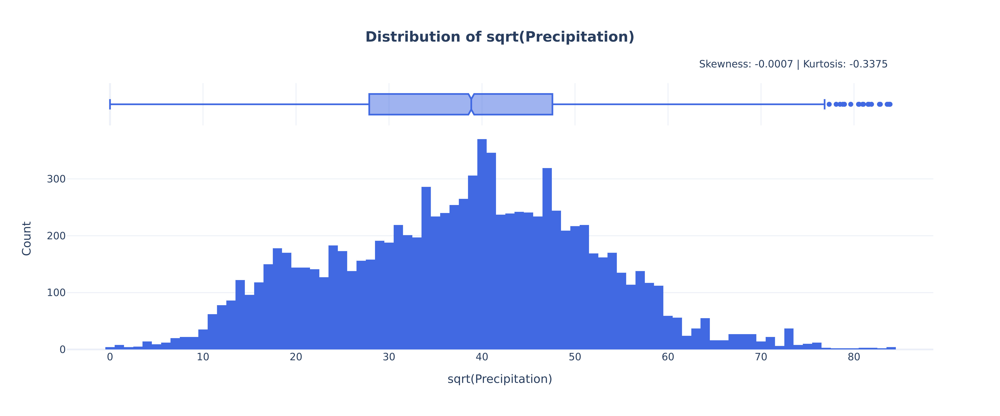

In [11]:
precip_sqrt = np.sqrt(df_clean['Mean.Precipitation'])
s = skew(precip_sqrt)
k = kurtosis(precip_sqrt)

fig = px.histogram(
    x=precip_sqrt, 
    nbins=100, 
    title='<b>Distribution of sqrt(Precipitation)</b>',
    marginal='box', 
    color_discrete_sequence=['royalblue']
)

fig.add_annotation(
    text=f"Skewness: {s:.4f} | Kurtosis: {k:.4f}",
    xref="paper", yref="paper",
    x=0.95, y=1.1,
    showarrow=False,
    font=dict(size=12)
)

fig.update_layout(
    title_x=0.5, 
    yaxis_title="Count", 
    xaxis_title="sqrt(Precipitation)",
    width=1200,
    height=500,
    template="plotly_white"
)

fig.write_image("Precipitation_Sqrt_Histogram.png", scale=5)
display(Image("Precipitation_Sqrt_Histogram.png"))

Now, since both mass and precipitation are normally distributed, a parametric measure is used, which is Pearson's correlation coefficient.

* H0: There is no correlation between mass and precipitation.
* H1: There is a correlation between mass and precipitation. 

In [12]:
df_clean['Sqrt_Precip'] = np.sqrt(df_clean['Mean.Precipitation'])

corr, p_val = pearsonr(df_clean['Log_Mass'], df_clean['Sqrt_Precip'])

print(f"Pearson Correlation Coefficient (r): {corr:.4f}")
print(f"P-value: {p_val:.4e}")

Pearson Correlation Coefficient (r): -0.0639
P-value: 2.1410e-10


Since p < 0.05, the null hypothesis is rejected. There is a statistically significant relationship between mass and precipitation. To illustrate the relationship, a scatter plot is created:

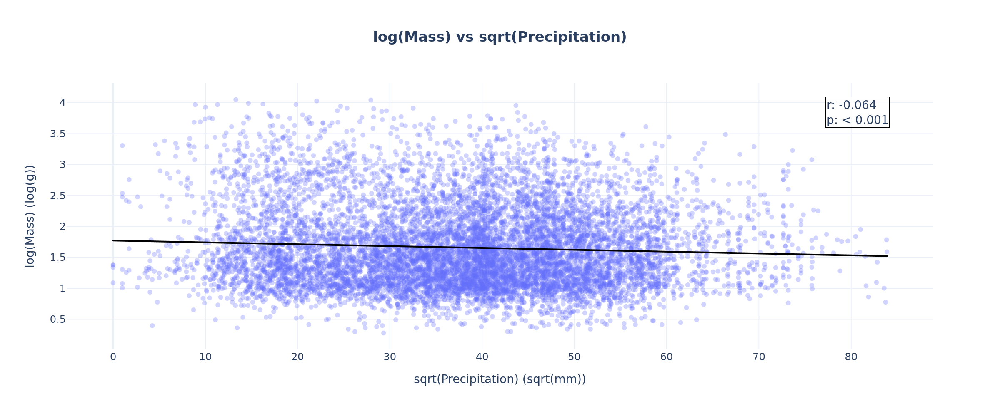

In [13]:
corr, p_val = pearsonr(df_clean['Log_Mass'], df_clean['Sqrt_Precip'])
p_text = "< 0.001" if p_val < 0.001 else f"{p_val:.3f}"

fig = px.scatter(
    df_clean, 
    x='Sqrt_Precip', 
    y='Log_Mass', 
    trendline='ols', 
    trendline_color_override='black',
    title='<b>log(Mass) vs sqrt(Precipitation)</b>',
    labels={'Sqrt_Precip': 'sqrt(Precipitation) (sqrt(mm))', 'Log_Mass': 'log(Mass) (log(g))'},
    opacity=0.3,
    template='plotly_white'
)

fig.add_annotation(
    text=f"r: {corr:.3f}<br>p: {p_text}",
    xref="paper", yref="paper",
    x=0.95, y=0.95,
    showarrow=False,
    bgcolor="rgba(255, 255, 255, 0.8)", bordercolor="black", borderwidth=1,
    font=dict(size=14),
    align="left"
)

fig.update_layout(
    title_x=0.5,
    width=1200,
    height=500
)

fig.write_image("Mass_Precipitation.png", scale=2)
display(Image("Mass_Precipitation.png"))

## **2. Leg Size (Tarsus Length)**

First of all, distribution of tarsus length is explored using histograms, as well as skewness and kurtosis. For the raw data: 

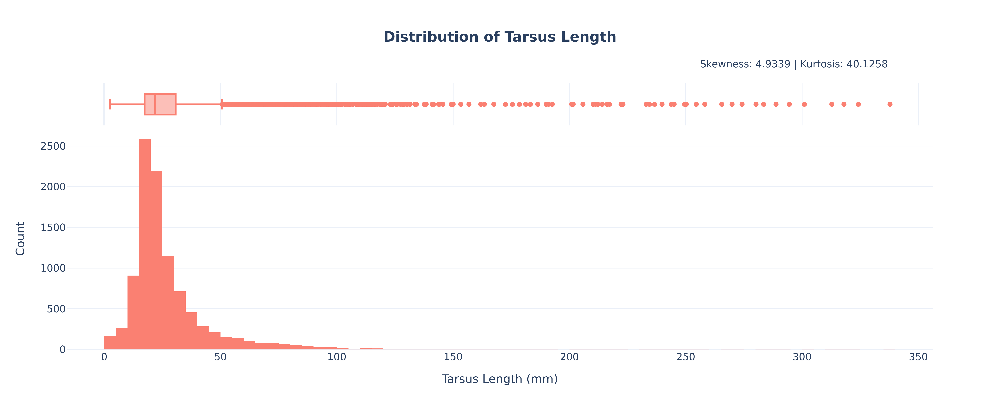

In [14]:
s = skew(df_clean['Tarsus.Length'])
k = kurtosis(df_clean['Tarsus.Length'])

fig = px.histogram(
    df_clean, 
    x='Tarsus.Length', 
    nbins=100, 
    title='<b>Distribution of Tarsus Length</b>',
    marginal='box',
    color_discrete_sequence=['salmon']
)

fig.add_annotation(
    text=f"Skewness: {s:.4f} | Kurtosis: {k:.4f}",
    xref="paper", yref="paper",
    x=0.95, y=1.1,
    showarrow=False,
    font=dict(size=12)
)

fig.update_layout(
    title_x=0.5,
    yaxis_title="Count",
    xaxis_title="Tarsus Length (mm)",
    template="plotly_white",
    width=1200,
    height=500
)

fig.write_image("Tarsus_Raw_Histogram.png", scale=5)
display(Image("Tarsus_Raw_Histogram.png"))

The data is extremely right-skewed. In addition, there are 3 outliers that disrupt the visualization (>350). To approach a biologically meaningful distribution and improve the visualization, log-transformation is applied. Additionally, the outliers are excluded since they make up a negligible fraction of the dataset (3/9878). Skewness and kurtosis are calculated.

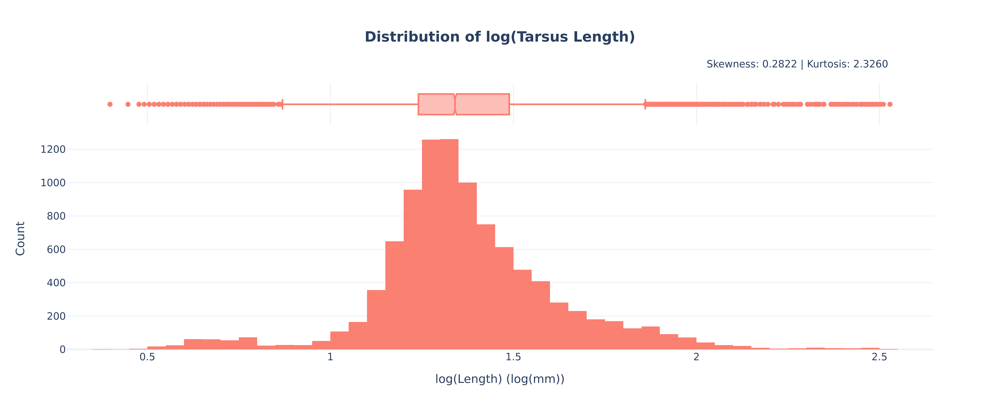

In [15]:
df_clean = df[(df['Tarsus.Length'] < 350) & (df['Tarsus.Length'] > 0)].copy()
df_clean['Log_Tarsus'] = np.log10(df_clean['Tarsus.Length'])

fig = px.histogram(
    df_clean, 
    x='Log_Tarsus', 
    title='<b>Distribution of log(Tarsus Length)</b>', 
    nbins=100, 
    marginal='box',
    color_discrete_sequence=['salmon']
)

s = skew(df_clean['Log_Tarsus'])
k = kurtosis(df_clean['Log_Tarsus'])

fig.add_annotation(
    text=f"Skewness: {s:.4f} | Kurtosis: {k:.4f}",
    xref="paper", yref="paper",
    x=0.95, y=1.1,
    showarrow=False,
    font=dict(size=12)
)

fig.update_layout(
    title_x=0.5, 
    xaxis_title="log(Length) (log(mm))", 
    yaxis_title="Count", 
    template="plotly_white",
    width=1200,
    height=500
)

fig.write_image("Tarsus_Log_Histogram.png", scale=5)
display(Image("Tarsus_Log_Histogram.png"))

Since kurtosis > 1, it is not safe to assume normal distribution. Therefore, log transformation is kept only for visualization.

### **2.1. Tarsus Length and Temperature**

Since neither tarsus length nor temperature is normally distributed, Spearman's rank correlation coefficient is used.

For minimum temperature:

* H0: There is no correlation between tarsus length and minimum temperature.
* H1: There is a correlation between tarsus length and minimum temperature. 

In [16]:
correlation_rho, p_value_spearman = spearmanr(df_clean['Min.Temperature'], df_clean['Tarsus.Length'])

print(f"Spearman rho: {correlation_rho:.4f}")
print(f"p-value: {p_value_spearman:.4e}")

Spearman rho: -0.1210
p-value: 1.5550e-33


For maximum temperature:

* H0: There is no correlation between tarsus length and maximum temperature.
* H1: There is a correlation between tarsus length and maximum temperature.

In [17]:
correlation_rho, p_value_spearman = spearmanr(df_clean['Max.Temperature'], df_clean['Tarsus.Length'])

print(f"Spearman rho: {correlation_rho:.4f}")
print(f"p-value: {p_value_spearman:.4e}")

Spearman rho: -0.0421
p-value: 2.8860e-05


For average temperature:

* H0: There is no correlation between tarsus length and average temperature.
* H1: There is a correlation between tarsus length and average temperature.

In [18]:
correlation_rho, p_value_spearman = spearmanr(df_clean['Mean.Temperature'], df_clean['Tarsus.Length'])

print(f"Spearman rho: {correlation_rho:.4f}")
print(f"p-value: {p_value_spearman:.4e}")

Spearman rho: -0.1032
p-value: 8.6557e-25


For minimum, maximum, and average temperature, p < 0.05, thus the null hypotheses are rejected. Overall, there is a statistically significant relationship between tarsus length and temperature. To illustrate the relationships, scatter plots are created:

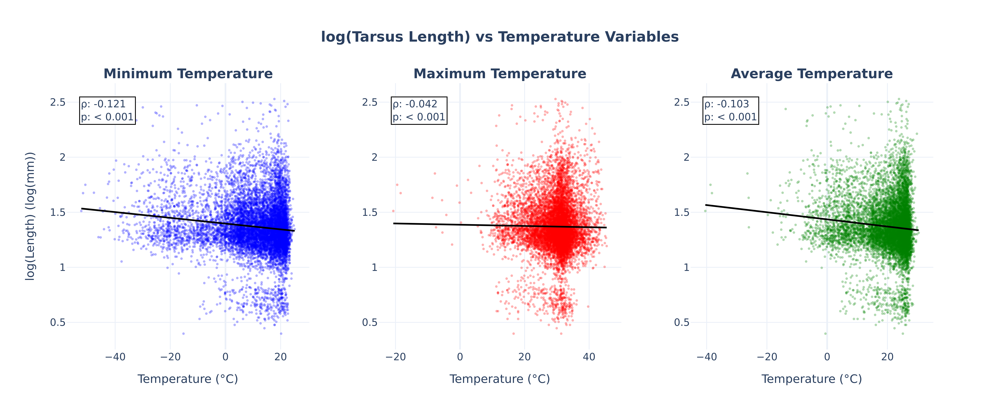

In [19]:
color_map = {
    'Min.Temperature': 'blue',
    'Max.Temperature': 'red',
    'Mean.Temperature': 'green'
}

fig = make_subplots(
    rows=1, cols=3,
    subplot_titles=("<b>Minimum Temperature</b>", "<b>Maximum Temperature</b>", "<b>Average Temperature</b>"),
    horizontal_spacing=0.08
)

for i, var in enumerate(['Min.Temperature', 'Max.Temperature', 'Mean.Temperature']):
    x_data = df_clean[var]
    y_data = df_clean['Log_Tarsus']

    rho, p_val = spearmanr(x_data, y_data)
    p_text = "< 0.001" if p_val < 0.001 else f"{p_val:.3f}"

    fig.add_trace(
        go.Scatter(
            x=x_data, y=y_data, 
            mode='markers', 
            marker=dict(size=3, color=color_map[var], opacity=0.3),
            showlegend=False
        ),
        row=1, col=i+1
    )

    m, b = np.polyfit(x_data, y_data, 1)
    x_line = np.linspace(x_data.min(), x_data.max(), 100)
    y_line = m * x_line + b
    
    fig.add_trace(
        go.Scatter(
            x=x_line, y=y_line, 
            mode='lines', 
            line=dict(color='black', width=2),
            showlegend=False
        ),
        row=1, col=i+1
    )

    xref_val = "x domain" if i == 0 else f"x{i+1} domain"
    yref_val = "y domain" if i == 0 else f"y{i+1} domain"

    fig.add_annotation(
        text=f"ρ: {rho:.3f}<br>p: {p_text}",
        xref=xref_val, yref=yref_val,
        x=0.05, y=0.95,
        showarrow=False,
        bgcolor="white",
        bordercolor="black",
        font=dict(size=12),
        align="left"
    )

    fig.update_xaxes(title_text="Temperature (°C)", row=1, col=i+1)

fig.update_yaxes(title_text="log(Length) (log(mm))", row=1, col=1)
fig.update_layout(
    title_text="<b>log(Tarsus Length) vs Temperature Variables</b>",
    title_x=0.5,
    height=500,
    width=1200,
    template="plotly_white"
)

fig.write_image("Tarsus_Temperature.png", scale=5)
display(Image("Tarsus_Temperature.png"))